In [2]:
import pandas as pd
import numpy as np
from kmapper.plotlyviz import *
import gower as gw
from umap.parametric_umap import ParametricUMAP
from sklearn.cluster import AgglomerativeClustering,SpectralClustering,DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS
import umap.umap_ as umap
import tensorflow as tf
import kmapper as km
import networkx as nx
import networkx.algorithms.community as nxcom
from community import community_louvain
import igraph as ig
import matplotlib.pyplot as plt
from pysankey2 import Sankey
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import matthews_corrcoef,f1_score,precision_score,recall_score,confusion_matrix,roc_auc_score,brier_score_loss,roc_curve,precision_recall_curve,auc
import matplotlib
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
from scipy.stats import ttest_ind, kruskal, chi2_contingency, fisher_exact,shapiro
import seaborn as sb
from statsmodels.stats.multitest import multipletests
import warnings
warnings.filterwarnings('ignore')
from statannotations.Annotator import Annotator
from itertools import combinations
import joblib

In [5]:
trainingset_experiment = pd.read_excel("data/trainingset_experiment.xlsx")
data_experiment = pd.read_excel("data/dataset_experiment.xlsx")

id_paz_CVrisk = pd.DataFrame(trainingset_experiment[['PATIENT_ID','CUORE_10yCV_riskscore']])

id_paz = trainingset_experiment['PATIENT_ID']

trainingset_binary_class_experiment = trainingset_experiment['Y_class']

features_to_exclude = ['PATIENT_ID','Y_class']

trainingset_experiment_features = trainingset_experiment.loc[:, ~trainingset_experiment.columns.isin(['PATIENT_ID','CUORE_10yCV_riskscore'])]

gower_distance_matrix = np.load("data/trainingset_distance_matrix.npy")

continue_features=  ["Age","Height","Weight","BMI","Systolic_blood_pressure","Diastolic_blood_pressure",'Heart_rate',
                  'Abdominal_circumference','Pelvis_circumference',  'Oxygen_saturation', "Years_as_a_smoker",
                    "Leukocytes","Erythrocytes","Haemoglobin","Haematocrit","MCV","MCH","MCHC","RDW","Platelets","MPV",
               'Neutrophils_%', 'Lymphocytes_%', 'Monocytes_%', 'Eosinophils_%', 'Basophils_#',
                  'Neutrophils_#', 'Lymphocytes_#', 'Monocytes_#', 'Eosinophils_#', 'Basophils_%', 'Blood_sugar', 
                  'Uric_acid', 'GGT', 'Total_bilirubin', 'hsTnI', 'Triglycerides','Total_cholesterol', 'HDL_cholesterol',
                  'LDL_cholesterol', 'CRP', 'hs-CRP', 'HbA1c-IFCC', 'HbA1c-DCCT']

categorical_features = (set(trainingset_experiment.columns).difference(set(continue_features))).difference(set(features_to_exclude)).difference(set(['CUORE_10yCV_riskscore']))



## TDA Mapper pipeline 

In [6]:
# define the inial palette for colouring the simplicial complex obtained with Mapper
pl_brewer = [[0.0, '#fcefb4'],  
             [0.1, '#FFBA08'],
             [0.2, '#FAA307'],
             [0.3, '#F48C06'],
             [0.4, '#E85D04'],
             [0.5, '#DC2F02'],
             [0.6, '#D00000'],
             [0.7, '#9D0208'],
             [0.8, '#6A040F'],
             [0.9, '#370617'],
             [1.0, '#03071E']]

def set_node_community(G, communities):
    """
    Function that assing to each node in the networkx graph the community as attribute
    INPUT:
    - G:           (networkx graph)  networkx graph obtained from the Mapper simplicial complex
    - communities: (list of int)    list of integers, containing the community assigned to each node in the graph G
    """
    for c, nodes_community_c in enumerate(communities):
        for node_c in nodes_community_c:
            G.nodes[node_c]['community'] = c + 1

            
def set_edge_community(G):
    """
    Function which searches for edges within the community and adds them.
    INPUT:
    - G:           (networkx graph)  networkx graph obtained from the Mapper simplicial complex        
    """
    for v, w, in G.edges:
        if G.nodes[v]['community'] == G.nodes[w]['community']:
            # Internal edge marked with the community (number)
            G.edges[v, w]['community'] = G.nodes[v]['community']
        else:
            # External edge marked with a 0
            G.edges[v, w]['community'] = 0

            
def get_color(i, r_off=1, g_off=1, b_off=1):
    """
    Function that assign the same color to the nodes in a community.
    INPUT:
       -i: (int) integer that define the community id
    OUTPUT:
       - (r, g, b): tuple indicating the community's colour, containing the levels of red, green and blue.
    """
        
    r0, g0, b0 = 0, 0, 0
    n = 16
    low, high = 0.1, 0.9
    span = high - low
    r = low + span * (((i + r_off) * 3) % n) / (n - 1)
    g = low + span * (((i + g_off) * 5) % n) / (n - 1)
    b = low + span * (((i + b_off) * 7) % n) / (n - 1)
    return (r, g, b)


def community_searching(G, method):
    """
    Function which allows to apply the communities discovering algorithm.
    INPUT:
    - G:           (networkx graph)  networkx graph obtained from the Mapper simplicial complex   
    - method:      (string)  string specifying the algorithm to use.
    OUTPUT:
    - node_color: (list) list of tuples containing the nodes colours in rgb 
    - internal: (list) list of edges belonging to communities
    - internal_color: (list) different communities colours
    - external: (list) list of edges external to communities 
    - [coverage,perfomance,modularity]:  (list) list of the partition perfomance scores
    """
    
    # apply the communities discovering algorithm
    if method == "Greedy modularity":
        communities = sorted(nxcom.greedy_modularity_communities(G), key=len , reverse=True)
    elif method == "Louvain":
        partition = community_louvain.best_partition(G,random_state =rnd)
        communities = []
        for comm_id in sorted(set(partition.values())):
            communities.append([node for node,community in partition.items() if community == comm_id])
    elif method == "Girvan Newman":
        comm = nxcom.girvan_newman(G)
        communities = [sorted(c) for c in next(comm)]
    elif method == "Label propagation":
        communities = nxcom.label_propagation_communities(G)
    elif method == "Infomap":
        g = ig.Graph.from_networkx(G)
        communities_subgraphs = g.community_infomap()
        communities = [list(communities_subgraphs.subgraphs()[i].get_vertex_dataframe()['_nx_name']) for i in range(len(communities_subgraphs))]

    # evaluate the partition with scores performance
    coverage, perfomance = nxcom.partition_quality(G,communities)
    print(coverage)
    print(perfomance)
    modularity = nxcom.modularity(G,communities)
    print(modularity)        
        
    # Define the nodes and the edges communities
    set_node_community(G, communities)
    set_edge_community(G)
        
    # get the colors of each node
    node_color = [get_color(G.nodes[v]['community']) for v in G.nodes]

    # Importing the colour of edges between members of the same community (internal) 
    # and edges between different communities
    external = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] == 0]
    internal = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] > 0]
    internal_color = ['black' for e in internal]
    return node_color, internal, internal_color,external,[coverage,perfomance,modularity]


def associate_patients_to_communities(G,scomplex,dataset):
    """
    Function that assing to each patient a node community (assing a subgroup).
    INPUT:
       - G:           (networkx graph)  networkx graph obtained from the Mapper simplicial complex   
       - scomplex:    (dictionary) simplicial complex resulting from the application of KeplerMapper
        - dataset     (pandas DataFrame) patients dataset
    OUTPUT:
       - new_dataset   (pandas DataFrame) patients dataset with an additional column, indicating the novel subroup.
    """              
    assigned_communitied = []
    for j in dataset.iterrows():
        patient_nodes = {}
        for key,values in scomplex["nodes"].items():
            if j[0] in values:
                patient_nodes[key] = G.nodes[key]['community']
                
                
        candidate_communities = list(pd.Series(patient_nodes.values()).value_counts().index )     
        canditate_frequencies = list(pd.Series(patient_nodes.values()).value_counts().values) 
        
        # case 1: the patient appears only in one node -> directly assing the community
        if len(candidate_communities)==1:
            assigned_communitied.append(candidate_communities[0])
            
        # case 2: the patient appears in more than one node
        elif len(candidate_communities)>1:
            
            # case 2a: there is a community majority -> assing this as the patient subgroup
            if canditate_frequencies[0]>canditate_frequencies[1]:
                assigned_communitied.append(candidate_communities[0])
                
            # case 2b: there isn't a community majority -> assing to the patient the community associated with
            #          the largest nodes
            else:
                
                max_frequency = max(canditate_frequencies)
                index_max = [i for i, j in enumerate(canditate_frequencies) if j == max_frequency]
                
                list_community_number_of_patients = []
                
                for index in index_max:
                    total_n_patients_in_all_nodes_for_specific_community = 0
                    for node,community in patient_nodes.items():
                        if community == candidate_communities[index]:
                            total_n_patients_in_all_nodes_for_specific_community += len(scomplex['nodes'][node])
                    
                    list_community_number_of_patients.append(total_n_patients_in_all_nodes_for_specific_community)
                
                max_size = max(list_community_number_of_patients)
                assigned_communitied.append(candidate_communities[list_community_number_of_patients.index(max(list_community_number_of_patients))])
        
    new_dataset = dataset.copy(deep=True)
    new_dataset['communities'] = assigned_communitied    
    return new_dataset


In [7]:
def enrich_topology(scomplex,enrichment_feature, colormap, axs_to_plot, colours_method, communities_separated,
                    internal,internal_color,colorbar_labelsize,colorbar_ticks_size):
    
    """
    Function that allows to enrich (i.e. to color) the simplicial complex with a variable.
    INPUT:
       - scomplex:    (dictionary) simplicial complex resulting from the application of KeplerMapper
       - enrichment_feature: (pandas Series) dataset's column indicating the enrichment feature
       - colormap: (string) matplotlib colormap to use to enrich the simplicial complex
       - axs_to_plot: (matplotlib.axes) axes in which plot the enrichment
       - colours_method: (string) string that specify the type of the feature for the enrichment
       - communities_separated: (boolean) flag that indicates if in the plot the communities are drawn separately
       - internal: (list) list of edges belonging to communities
       - internal_color: (list) different communities colours
       - colorbar_labelsize: (int) size of the colorbar labels
       - colorbar_ticks_size: (int) size of the colorbar tick
    """
    kmgraph,  mapper_summary, colorf_distribution = get_mapper_graph(scomplex)
    G = km.adapter.to_nx(scomplex)
    new_color = []  
    
    # if the enrichment variable is categorical -> colors according to the proportion of the positive class
    if colours_method == "categorical":
        dict_categorical = {0: 'Class_0', 1: 'Class_1'}
        for j, node in enumerate(kmgraph['nodes']):
            member_label_ids = enrichment_feature[scomplex['nodes'][node['name']]]         #al node j-esimo associo 0-1 in base alla classe  (se volessi colorare rispetto ad altro basta modificare questa riga e il rispettivo dict)
            member_labels = [dict_categorical[id] for id in member_label_ids]     #in questo modo ad opgni nodo viene creato un vettore contentente class0 o class1 in base ai pazienti che apprtengono a quel nodo
            label_type, label_counts = np.unique(member_labels, return_counts=True)  #in questo modo so la frequenza della classi nel nodo e in ogni nodo

            n_members = label_counts.sum()
            if label_type.shape[0] == 1:          # Se presente solo la classe 1 o classe 0 vuol dire che il vettore ha solo una dimensione 
                if label_type[0] == 'Class_0':
                    new_color.append(0.0)           # Associo il colore basso del range
                else:
                    new_color.append(1.0)           # Associo il colore alto del range
            else:
                new_color.append(1.0*label_counts[1]/n_members)   # Associo il colore in base alla proporzione della Classe 0

    # if the enrichment variable is numerical -> colors according to the mean of the variables
    elif colours_method == "numerical":
        for j, node in enumerate(kmgraph['nodes']):
            member_feature = enrichment_feature[scomplex['nodes'][node['name']]]       
            new_color.append(np.mean(member_feature))
        
    # if communities_separated is True, plot the graph with communities separated
    if communities_separated:
        nx.draw_kamada_kawai(G,node_color = new_color, edgelist=internal, edge_color = internal_color, node_size=90,cmap = colormap,ax=axs_to_plot)
    else:
        nx.draw_kamada_kawai(G,node_color = new_color, node_size=80,cmap = colormap,ax=axs_to_plot)
       
    # associate to the graph plot a colorbar
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    cbar = plt.colorbar(sm,ax=axs_to_plot, pad=0,fraction=0.05)
    cbar.set_label(label=enrichment_feature.name,size=colorbar_labelsize) 
    cbar.ax.tick_params(labelsize=colorbar_ticks_size)
            
def sankey_diagram(dataset_with_communities, class_feature, dict_class_features_value_to_label, 
                   dict_class_features_label_to_color, node_color_communities):
    """
    Function that plot with a sankey diagram the initial phenotype and the new stratification.
    INPUT:
       - dataset_with_communities:  (pandas DataFrame) patients dataset with the new subgroups as a new column
       - class_feature: (pandas Series) dataset's column indicating the intial phenotype feature
       - dict_class_features_value_to_label: (dict) dictionary with label and (initial) phenotype name as key and value, respectively
       - dict_class_features_label_to_color: (dict) dictionary with (initial) phenotype name and color as key and value, respectively
       - node_color_communities: (list) list of tuples containing the nodes colours in rgb 

    """
    dataset_sankey = dataset_with_communities.copy()
    class_values = sorted(list(dataset_with_communities[class_feature].value_counts().index))
    
    color_dict = {'layer1':{}}
    layer_labels = {'layer1':{}}

    layer_label_to_insert = []
    for value in class_values:
        dataset_sankey[class_feature] = dataset_sankey[class_feature].replace(to_replace=value,value=dict_class_features_value_to_label[value])
        color_dict['layer1'][dict_class_features_value_to_label[value]] = dict_class_features_label_to_color[dict_class_features_value_to_label[value]]
        layer_label_to_insert.append(dict_class_features_value_to_label[value])
    layer_labels['layer1'] = layer_label_to_insert
    
    communities = [x for x in range(1, len(set(node_color_communities))+1)]
    color_communities = [get_color(c) for c in communities]
    
    dict_communities_colors = {}
    for c in range(len(communities)):
        dict_communities_colors[communities[c]] = color_communities[c]
    color_dict['layer2'] = dict_communities_colors
    layer_labels['layer2'] = list(dict_communities_colors.keys())
        
    dataset_sankey_diagram = dataset_sankey[[class_feature,"communities"]].copy()
    dataset_sankey_diagram = dataset_sankey_diagram.rename(columns={class_feature:"layer1","communities":"layer2"})

    # plot sankey diagram
    sankey= Sankey(dataset_sankey_diagram,colorMode="layer",colorDict=color_dict,layerLabels = layer_labels,stripColor="left")
    fig,ax = sankey.plot(fontSize=20,figSize=(10,6))
    fig.savefig("results/sankey.png",bbox_inches="tight",dpi=400)

In [11]:
def TDA_patiets_phenotyping_pipeline(distance_matrix,projection_lens,resolution,p_overlap,cluster_method, 
                                     weighted,id_pz, continue_feature,
                                     categorical_feature, categorical_feature_colormap, 
                                     community_detection_algorithm,
                                     dataset, path_dataset,plots):
    """
    Function that wrap the overall TDA pipeline.
    INPUT:
        - distance_matrix:      (numpy ndarray) patients distance matrix
        - projection_lens:      (sklearn or umap-learn object) the projection lens to use
        - resolution :          (int) resolution parameter to use
        - p_overlap :           (float) gain parameter to use
        - cluster_method:       (sklearn cluster method) cluster method to use
        - weighted:             (string) string used to specify if the graph obtained with KeplerMapper need to be weighted
        - id_pz    :            (pandas Series) dataset's column indicating the samples IDs
        - continue_feature :    (string) continue feature, used to weight the graph edges
        - categorical_feature:  (string) categorical feature, used to enrich the graph and for sankey diagram
        - categorical_feature_colormap: (string) matplotlib colormap to use to enrich the simplicial complex
        - community_detection_algorithm: (string) communities detection algorithm to use
        - dataset :              (pandas DataFrame) patients dataset
        - path_dataset:         (string) the path in which the dataset with the new column, identifying the subgroup, will be written
        - plots:                (boolean) flag used to specify that the results will be plotted
    OUTPUT:
        - dataset_with_communities   (pandas DataFrame) patients dataset with an additional column, indicating the novel subroup.
        - scomplex:    (dictionary) simplicial complex resulting from the application of KeplerMapper
        - (internal, internal_color) tuples of list of edges belonging to communities and different communities colours
        - node_color: (list) list of tuples containing the nodes colours in rgb 
        - G:           (networkx graph)  networkx graph obtained from the Mapper simplicial complex   
    """
    
    # apply the KeplerMapper pipeline to obtain a simplicial complex
    projection = mapper.project(distance_matrix, projection= projection_lens,distance_matrix = None, scaler = None)
    scomplex = mapper.map(projection, distance_matrix, 
                cover=km.Cover(n_cubes=resolution, perc_overlap=p_overlap), clusterer = cluster_method,  precomputed=True,
                                     remove_duplicate_nodes = True)
    
    # from simplicial complex to networkx graph
    G = km.adapter.to_nx(scomplex)
    
    # weighted string it not empy -> add weights to the graph edges
    if weighted!="":
        for edge in G.edges:
            node_A = scomplex['nodes'][edge[0]]
            node_B = scomplex['nodes'][edge[1]]
            
            # weight the edges with the number of patients in common between the nodes
            if weighted == "intersection_size":
                G[edge[0]][edge[1]]['weight']  = len(set(node_A).intersection(set(node_B)))
            # weight the edges with the mean value of a continue features from the patients that belong to the intersection
            elif weighted == "intersection_feature":
                G[edge[0]][edge[1]]['weight']  = np.mean(continue_feature[set(node_A).intersection(set(node_B))])
    
    
    # search communities
    node_color, internal, internal_color, external,scores = community_searching(G,community_detection_algorithm)
    
    # visualization
    if plots!=False:
    
        f, axs = plt.subplots(1,2,figsize=(16,6),layout="tight")
        
        # the graph created with KeplerMapper
        nx.draw_kamada_kawai(G, node_size=90,ax=axs[0])
        
        # the graph enriched with the initial phenotype and communities separated
        enrich_topology(scomplex,dataset[categorical_feature],categorical_feature_colormap,axs[1],"categorical",True,internal,internal_color,28,20)

        
    # associate patients to communities
    dataset_with_communities = associate_patients_to_communities(G,scomplex,dataset)
    dataset_with_communities['PATIENT_ID'] = id_paz
    if path_dataset!=None:
        dataset_with_communities.to_excel(path_dataset,index=False)
    
    # sankey diagram
    if (categorical_feature != None):
        sankey_diagram(dataset_with_communities, categorical_feature, {0:"NOATH",1:"ATH"}, 
                       {"NOATH":'#3B4CC0',"ATH":'#B40426'}, node_color)

    
    return dataset_with_communities,scomplex,(internal, internal_color),node_color, G

0.908974358974359
0.7872764916243177
0.6665655818540434


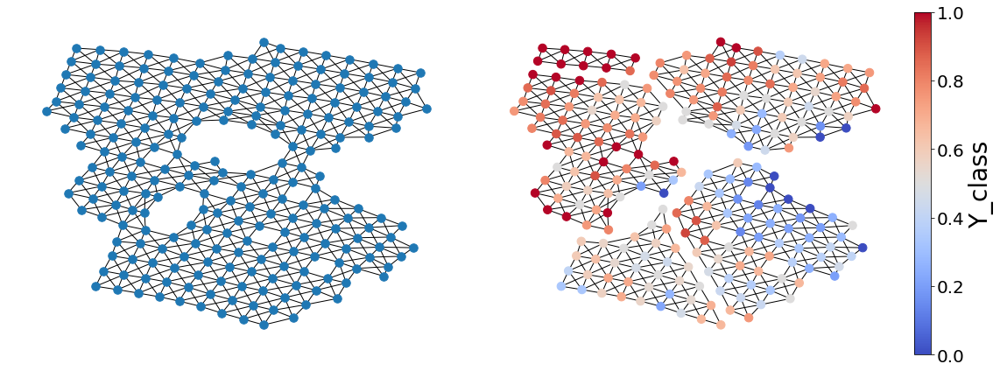

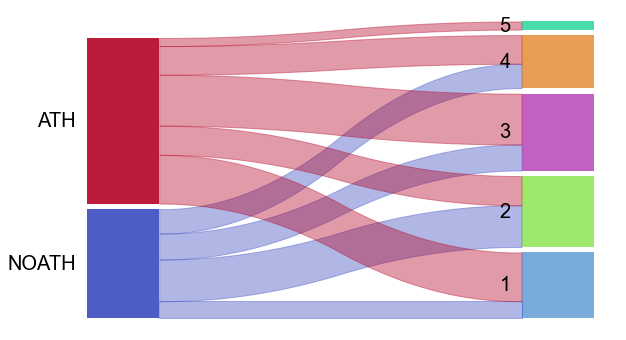

In [12]:
mapper = km.KeplerMapper()
dataset_with_communities,scomplex,tuple_internal_color,node_color, G= TDA_patiets_phenotyping_pipeline(gower_distance_matrix,umap.UMAP(n_components=2, random_state=203, n_neighbors= 50, min_dist=0.9),
                                        18,0.5,DBSCAN(metric='precomputed', min_samples=2,eps=0.5,n_jobs=-1), "",id_paz,
                                     "", 'Y_class', 'coolwarm', "Greedy modularity",
                                      trainingset_experiment_features,"results/trainingset_experiment_communities.xlsx",True)

## Traing classifier models to obtain the variables importance

In [12]:
def make_dummies_and_scale (dataset, patient_id, categorical_features, continue_features, dummy_flag, scale_flag):
    """
    Function that makes dummies variables from categorical variables and scale the numerical variable in the range [0,1].
    INPUT:
        - dataset :              (pandas DataFrame) patients dataset
        - patient_id:            (pandas Series) dataset's column indicating the samples IDs
        - categorical_features: (list) list of dataset categorical features
        - continue_features: (list) list of dataset numerical features
        - dummy_flag: (boolean) flag used to specify that we want to make dummy variables from categorical ones.
        - scale_flag:  (boolean) flag used to specify that we want to make dummy variables from numerical ones. 
    OUTPUT:
        - dataset: (pandas DataFrame) patients dataset with dummy variables and scaled 
    """
    if dummy_flag:
        df_categorical_dummies = pd.get_dummies(dataset[categorical_features].astype(str),drop_first=True)
        df_categorical_dummies['PATIENT_ID'] = patient_id
        df_continue = dataset[continue_features]
        df_continue['PATIENT_ID'] = patient_id
        dataset = pd.merge(df_categorical_dummies,df_continue, on="PATIENT_ID")
        del dataset['PATIENT_ID']
    
    if scale_flag:
        X = dataset.values
        min_max_scaler = preprocessing.MinMaxScaler()
        X_scaled = min_max_scaler.fit_transform(X)
        dataset= pd.DataFrame(X_scaled, columns = dataset.columns)
    
    return dataset


def training_classifier(X_train, y_train,classifier, rnd,categorical_features,continue_features,id_paz,cv_split,community):
    """
    Function that train a classifier model with cross validation, while tuning its parameters with a grid search.
    Return the variables selected for each model and the model with the best hyperparameters fitted on X_train.
    INPUT:
        - X_train: (pandas DataFrame) patients features 
        - y_train: (pandas Series) binary class 
        - classifier: (string) name of the classifier
        - rnd: (int) seed for reproducible output
        - categorical_features: (list) list of dataset categorical features
        - continue_features: (list) list of dataset numerical features
        - id_paz: (pandas Series) dataset's column indicating the samples IDs
        - cv_split: (int) number of fold K for K-cross validation
        - community: (int) community  id
    OUTPUT:
        - variables_selected: (dict) dictionary with variables:variables_importance, selected by the model.
        - grid_search: (sklearn GridSearchCV) fitted model with the optimal combination of hyperparameters, fitted on X_train.
    """
        
    # define the metrics for the hyperparameters grid search
    score = ["roc_auc"]
#     if min(y_train.value_counts())/len(y_train) <= 0.20:
#         score = ['balanced_accuracy','f1' ,'roc_auc']
#     else:
#         score = ['accuracy','f1'  ,'roc_auc']
        
    if classifier == "logistic regression":
        X_train = make_dummies_and_scale(X_train,id_paz,categorical_features, continue_features, True, True)
        log_reg = LogisticRegression(penalty="elasticnet",solver="saga",random_state=rnd)
        parameters_grid = {"C" : [1000, 100, 10, 1, 0.1,0.01,0.001],"l1_ratio" : [0.25,0.5,0.75]}
            
        grid_search = GridSearchCV(estimator = log_reg, param_grid = parameters_grid, 
                            cv = 5, n_jobs = -1,scoring=score,refit = score[0])
        grid_search.fit(X_train, y_train)
        coef_value = grid_search.best_estimator_.coef_
        coef_name = X_train.columns
        
    if classifier == "random forest":
        X_train = make_dummies_and_scale(X_train,id_paz,categorical_features, continue_features, True, False)
        rf = RandomForestClassifier(max_features = "sqrt", random_state = rnd,bootstrap = False)
        parameters_grid = {'n_estimators': [100,200,300],
                        'max_depth': [1,3,5],
                        'min_samples_split': [2, 5, 10],
                        'min_samples_leaf': [1, 5]}

        grid_search = GridSearchCV(estimator = rf, param_grid = parameters_grid, 
                            cv = 5, n_jobs = -1,scoring=score,refit = score[0])
        grid_search.fit(X_train, y_train)
        
        coef_value = grid_search.best_estimator_.feature_importances_
        coef_name = grid_search.best_estimator_.feature_names_in_  

    elif classifier == "XGBoost":
        X_train = make_dummies_and_scale(X_train,id_paz,categorical_features, continue_features, True, False)
        xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=rnd, booster="gbtree")
        parameters_grid = {"learning_rate":[0.1, 0.25, 0.5], "gamma":[0, 0.1, 0.2, 0.3],
                            'max_depth': [1,3,5], "n_estimators":[100,200,300] }

        grid_search = GridSearchCV(estimator = xgb_model, param_grid = parameters_grid, 
                            cv = 5, n_jobs = -1,scoring=score,refit = score[0])
        grid_search.fit(X_train, y_train)
        
        coef_value = grid_search.best_estimator_.feature_importances_
        coef_name = grid_search.best_estimator_.feature_names_in_


    print("Community " + str(community) + "- Best model parameters: " + str(grid_search.best_params_) + " that leads to the following score: "+str(grid_search.best_score_)" +- " str(grid_search.best_score_std))
    
    # compute classification score, ROC curves and PR curves
    compute_classification_score(X_train, y_train , grid_search,classifier)
    
    if classifier == "logistic regression":
        # extract features importance 
        coef = pd.Series(coef_value[0],index=coef_name)
    else:
        coef = pd.Series(coef_value,index=coef_name)

    
    #take the first five variables according to their importance (already sorted)
    coef = coef[coef>0]  
    if len(coef)>5:
        coef = coef[:5]

    coef = coef.sort_values(ascending=False)
    variables_selected = coef.to_dict()
    
    return variables_selected,grid_search
    


def plot_variable_importance(classifier,imp_coef,scomplex,tuple_internal_color,dataset,continue_features):
    """
    Function that enrich the simplicial complex with the 5 top features according to their variable importance
    """
    if len(imp_coef)>5:
        coef_enrichment = imp_coef[:5]
    else:
        coef_enrichment = imp_coef
    
        n_var = len(coef_enrichment)
        n_row = 5
        n_col = 2
            
        f, axs = plt.subplots(n_row,n_col,figsize=(14,n_row*5),layout="tight")
        c = r = 0
        
        for key,value in coef_enrichment.to_dict().items():
            
            if c == 2:
                c = 0
                r +=1
            
            print(key)
            # if the variable is categorical
            if key not in continue_features:
                enrich_topology(scomplex,dataset[key],'Blues',axs[r,c],"categorical",True,tuple_internal_color[0],tuple_internal_color[1],28,20)
            # if the variable is numerical
            else:
                enrich_topology(scomplex,dataset[key], 'Oranges', axs[r,c], "numerical",True,tuple_internal_color[0],tuple_internal_color[1],28,20 )
            
            c+=1

        plt.show()
        
        
def compute_classification_score(X_train,y_true,fitted_model,classifier):
    """
    Function that computes different classification score, ROC and PR curves.
    INPUT:
        - X_train: (pandas DataFrame) patients features 
        - y_true:  (pandas Series) outcome to predict
        - fitted_model: (sklearn GridSearchCV) fitted model with the optimal combination of hyperparameters, fitted on X_train
        - classifier: (string) classifier name
    """
    prob_pred = fitted_model.predict_proba(X_train)
    label_pred = fitted_model.predict(X_train)
    
    mcc = matthews_corrcoef(y_true,label_pred)
    f1 = f1_score(y_true,label_pred)
    precision = precision_score(y_true,label_pred)
    sentivity = recall = recall_score(y_true,label_pred)
    cm = confusion_matrix(y_true,label_pred)
    specificity = cm[0,0]/(cm[0,1]+cm[0,0])
    PPV = cm[1,1]/(cm[0,1]+cm[1,1])
    NPV = cm[0,0]/(cm[1,0]+cm[0,0])
    
    auc_roc = roc_auc_score(y_true,prob_pred[:,1])
    brier = brier_score_loss(y_true,prob_pred[:,1])
    
    fpr, tpr, thresholdsROC = roc_curve(y_true, prob_pred[:,1], pos_label=1)
    precisionr, recallr, thresholdsPR = precision_recall_curve(y_true, prob_pred[:,1], pos_label=1)
    auc_pr = auc(recallr, precisionr)
    
    f = plt.figure(figsize=(8,8),layout="tight")
    gs = plt.GridSpec(2, 2, figure=f)
    ax1 = f.add_subplot(gs[0, 0])
    ax2 = f.add_subplot(gs[1, 0])
    ax3 = f.add_subplot(gs[:, 1])
    ax1.grid(True)
    ax1.plot(fpr,tpr)
    ax1.set_xlabel("False positive rate (1-specificity)",fontsize=14)
    ax1.set_ylabel("True positive rate (sensitivity)",fontsize=14)
    ax1.set_xticklabels([str(round(i,3)) for i in ax1.get_xticks()], fontsize = 13)
    ax1.set_yticklabels([str(round(i,3)) for i in ax1.get_yticks()], fontsize = 13)
    ax1.set_title(label="ROC curve",fontsize=14)
    ax2.grid(True)
    ax2.plot(precisionr,recallr)
    ax2.set_xticklabels([str(round(i,3)) for i in ax2.get_xticks()], fontsize = 13)
    ax2.set_yticklabels([str(round(i,3)) for i in ax2.get_yticks()], fontsize = 13)
    ax2.set_xlabel("Recall",fontsize=14)
    ax2.set_ylabel("Precision",fontsize=14)
    ax2.set_title(label="PR curve",fontsize=14)
    
    
    list_table_print = [["AUC - ROC: " + str(round(auc_roc,4))],
                        ["sentivity: " + str(round(sentivity,4))],
                        ["specificity: " + str(round(specificity,4))],
                        ["PPV: " + str(round(PPV,4))],
                        ["NPV: " + str(round(NPV,4))],
                        ["AUC - PR: " + str(round(auc_pr,4))],
                        ["precision: " + str(round(precision,4))],
                        ["recall: " + str(round(recall,4))],
                        ["f1: " + str(round(f1,4))],
                        ["MCC: " + str(round(mcc,4))],
                        ["brier: " + str(round(brier,4))]]
    columns = ("Classifier: ", classifier)
    ax3.axis('tight')
    ax3.axis('off')
    the_table = ax3.table(cellText=list_table_print, colLabels=columns, loc='center',colWidths=[0.5,0.5])
    
    plt.show()
    
    

In [13]:
def computational_phenotyping(dataset_with_communities,features_to_exclude,classifier,rnd,categorical_features,
                              continue_features,id_paz,cv_split,scomplex,tuple_internal_color,
                             variable_imp):
    """
    Function that wrap the computational phenotyping.
    INPUT:
        - dataset_with_communities   (pandas DataFrame) patients dataset with an additional column, indicating the novel subroup.
        - features_to_exclude: (list) a list of columns to exclude from the dataset (in order to obtain only clinical features)
        - classifier: (string) classifier name
        - id_paz: (pandas Series) dataset's column indicating the samples IDs
        - cv_split: (int) number of fold K for K-cross validation
        - scomplex:    (dictionary) simplicial complex resulting from the application of KeplerMapper
        - tuple_internal_color:  tuples of list of edges belonging to communities and different communities colours
        - variable_imp: (boolean) flag for visualizing the enrichment graph for each variables
    OUTPUT:
        - variables_selected: (dictionary) nested dictionary -> community:dict_var , with dict_var -> variable:variable_importance
        - best_model_community: (dictionary) dictionary of  community:best_fitted_model
    """
    
    communities = sorted(set(dataset_with_communities['communities']))

    variables_selected = {}
    best_model_community = {}
    
    X_train = dataset_with_communities.loc[:, ~dataset_with_communities.columns.isin(features_to_exclude)]
    
    # for each community define the y_class (the community itself)
    for community in communities:
        y_class = dataset_with_communities['communities'] == community 
        y_class = y_class.replace(to_replace=False,value=0)
        y_class = y_class.replace(to_replace=True,value=1)
        
        #train a classifier and obtain variables importance
        variables_selected_community,fitted_model = training_classifier(X_train, y_class,classifier, rnd,categorical_features,continue_features,id_paz,cv_split,community)
        variables_selected[community] = variables_selected_community
        best_model_community[community] = fitted_model

    # make dummies in order to plot the enrichment
    dataset_with_dummies = make_dummies_and_scale(X_train,id_paz,categorical_features, continue_features, True, None)

    if variable_imp:
        sb.set_style("whitegrid")
        for community,variables in variables_selected.items():
            list_color_edge_communities = []

            # define the edge color to highlight the community in the plot
            for index,edge in enumerate(tuple_internal_color[0]):
                if G.edges[edge]['community'] == community:
                    list_color_edge_communities.append("black")
                else:
                    list_color_edge_communities.append("gainsboro")

            tuple_internal_color = (tuple_internal_color[0],list_color_edge_communities)

            dataset_enrich = dataset_with_dummies
            plot_variable_importance(classifier,pd.Series(variables),scomplex,tuple_internal_color,dataset_enrich,continue_features)

            
        
    return variables_selected,best_model_community    

Community 1- Best model parameters: {'C': 0.1, 'l1_ratio': 0.25} that leads to the following score: 0.9565327120947389
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
12            0.956533           0.018458      0.910184     0.037155   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
12            0.97078          0.017269                  -0.044072   

    std_test_neg_brier_score  
12                  0.009331  


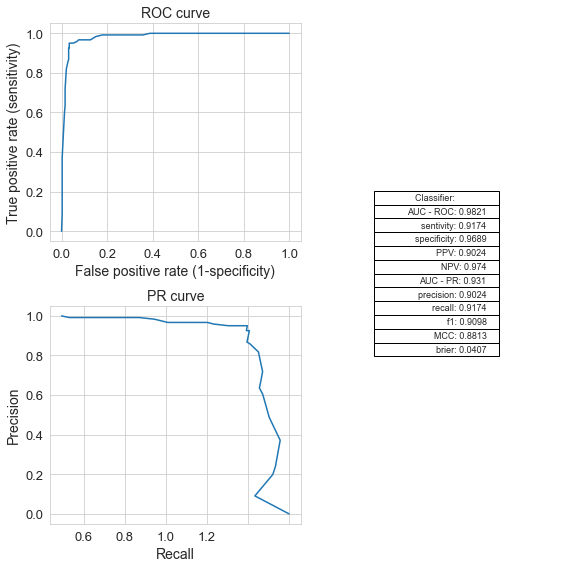

Community 2- Best model parameters: {'C': 1, 'l1_ratio': 0.75} that leads to the following score: 0.9290234905843526
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
11            0.929023            0.00708      0.853641     0.014737   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
11           0.973234          0.016102                  -0.055673   

    std_test_neg_brier_score  
11                  0.010347  


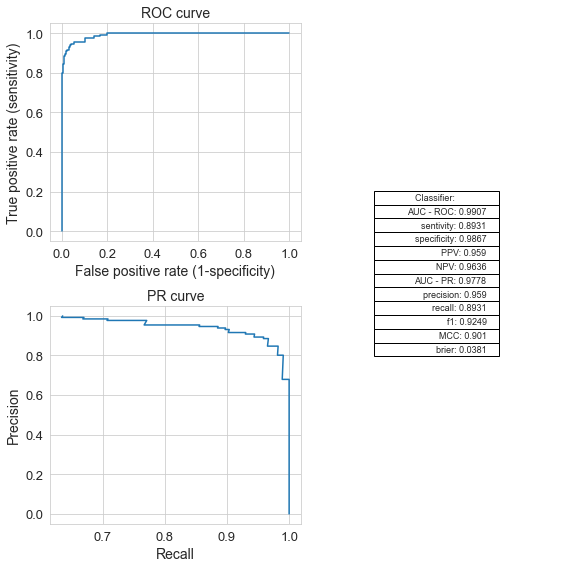

Community 3- Best model parameters: {'C': 1000, 'l1_ratio': 0.25} that leads to the following score: 0.9881770529994176
   mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
0            0.988177           0.007373      0.979164     0.012914   

   mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
0           0.998175          0.001892                  -0.011234   

   std_test_neg_brier_score  
0                   0.00546  


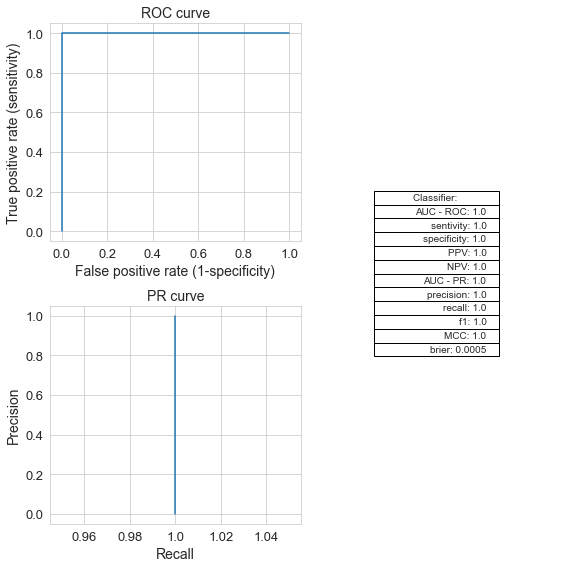

Community 4- Best model parameters: {'C': 1, 'l1_ratio': 0.75} that leads to the following score: 0.9265315615144456
    mean_test_balanced_accuracy  std_test_balanced_accuracy  mean_test_f1  \
11                     0.926532                    0.029152      0.851846   

    std_test_f1  mean_test_roc_auc  std_test_roc_auc  \
11     0.049978           0.981337          0.003896   

    mean_test_neg_brier_score  std_test_neg_brier_score  
11                  -0.046143                  0.005078  


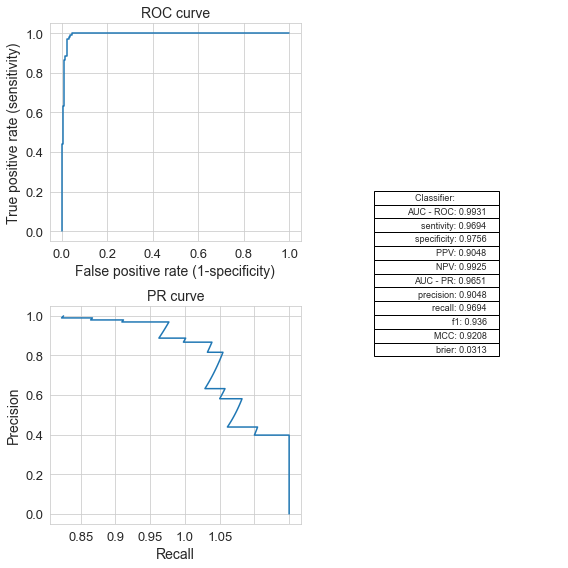

Community 5- Best model parameters: {'C': 100, 'l1_ratio': 0.25} that leads to the following score: 0.7625953411667697
   mean_test_balanced_accuracy  std_test_balanced_accuracy  mean_test_f1  \
3                     0.762595                    0.082491      0.586667   

   std_test_f1  mean_test_roc_auc  std_test_roc_auc  \
3         0.16           0.972191          0.016711   

   mean_test_neg_brier_score  std_test_neg_brier_score  
3                  -0.018735                  0.005611  


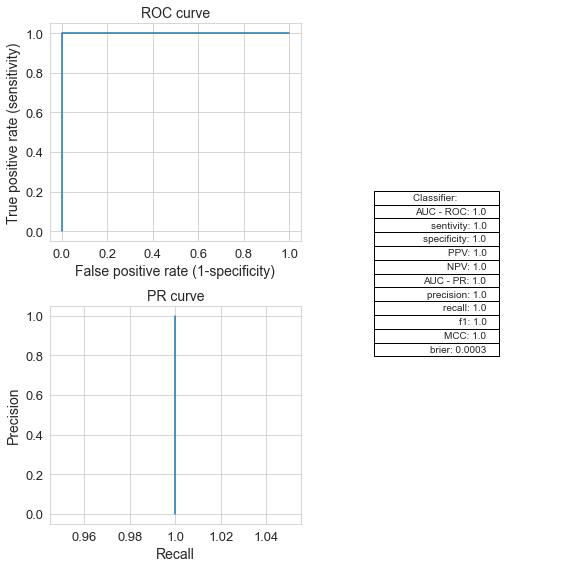

Anti-cholesterolemics_1
Statins_1
Hypercholesterolemia_1
Physical_activity_frequency_1
Hypertension_1
Beta-blockers_1
Antihypertensives_1


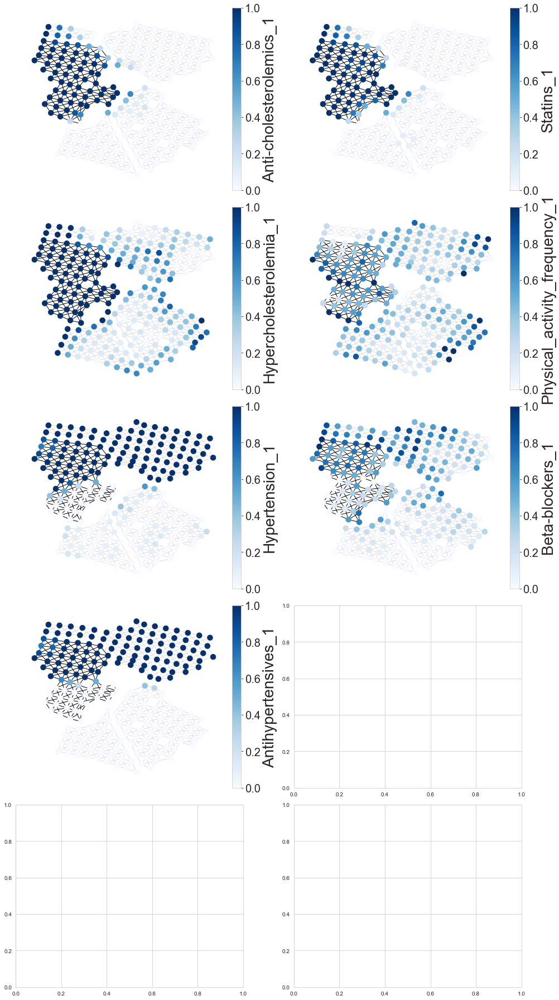

Sex_1
Menopause/andropause_1
Anaemia_1
Atypical_chest_pain_1
Family_history_of_cerebrovascular_disease_1
Peripheral_artery_disease_1
Angina_pectoris_1
Anxiolytic/Antidepressant_1
Arrhythmias_1
Neutrophils_#


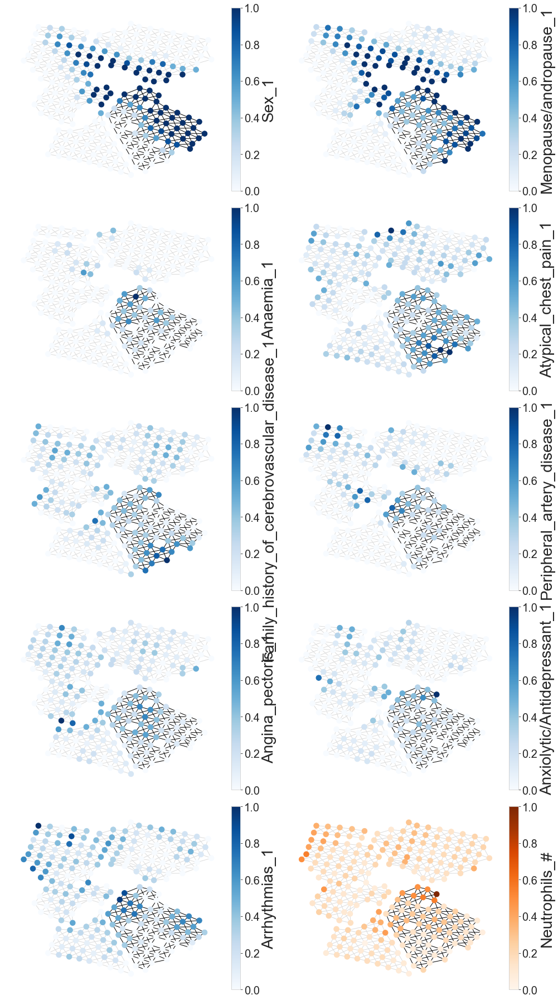

Antihypertensives_1
Hypertension_1
ACE_Inhibitors_1
Monocytes_%
Monocytes_#
Physical_activity_frequency_2
Physical_activity_frequency_1
Abdominal_circumference
Haemoglobin
Haematocrit


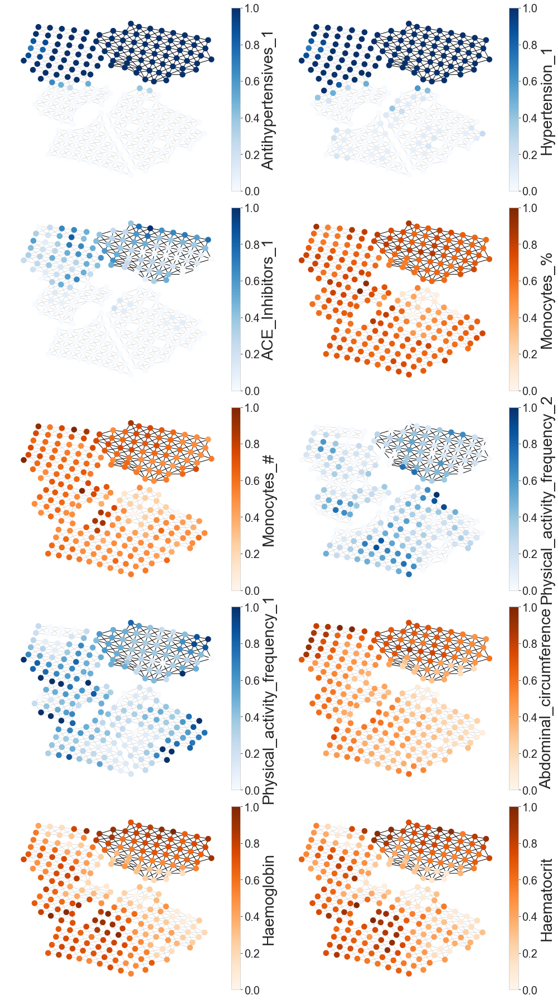

Smoking_habits_1
Monocytes_%
Hypercholesterolemia_1
Haematocrit
Diastolic_blood_pressure
Monocytes_#
Physical_activity_frequency_2
Height
Physical_activity_frequency_1
Weight


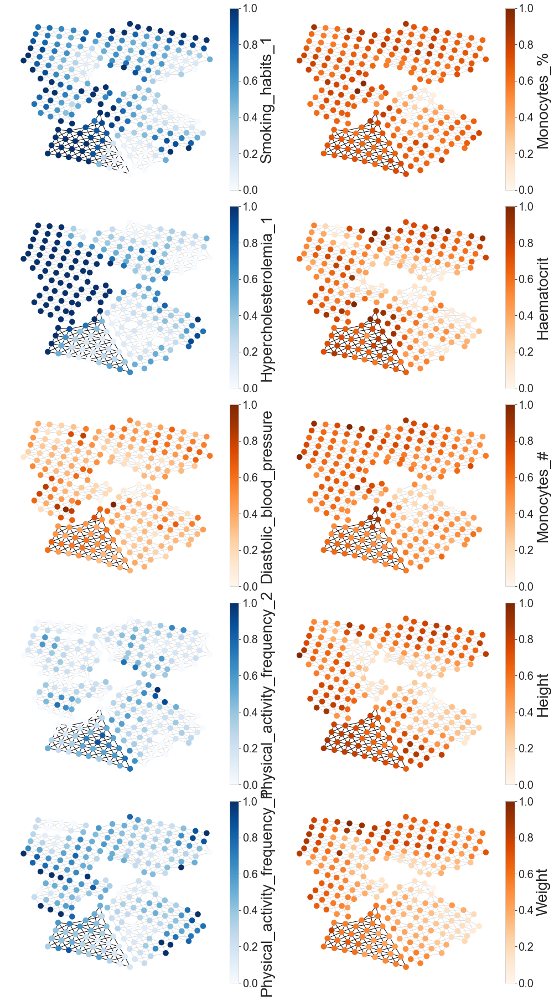

Hypoglycaemics_1
Clopidogrel_1
Calcium_antagonists_1
Arrhythmias_1
n-3_PUFA_1
Diabetes_mellitus_1
HbA1c-IFCC
Insulin_1
Blood_sugar
Atypical_chest_pain_1


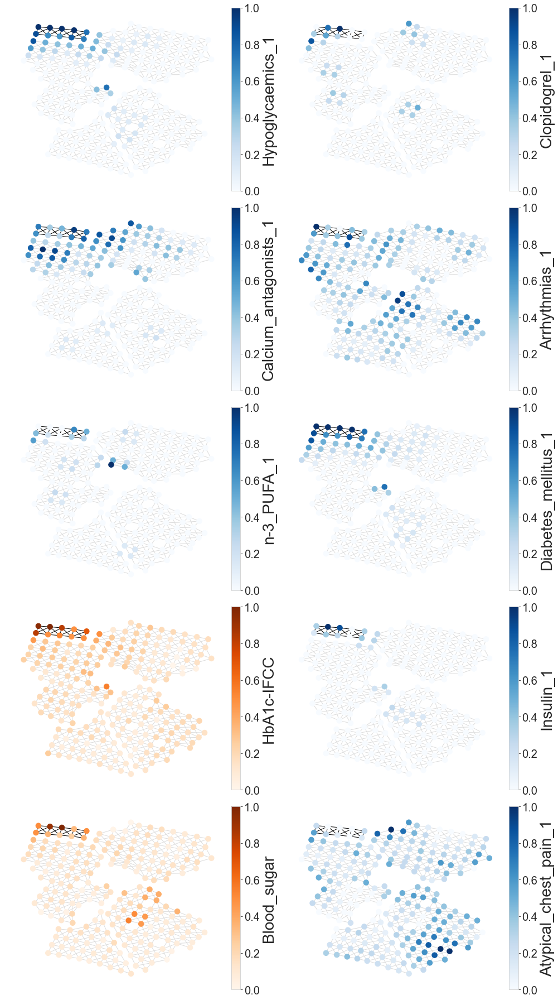

In [181]:
# Elastic Net logistic regression
discriminative_feaures_log, fitted_classifier_models_log = computational_phenotyping(dataset_with_communities,['PATIENT_ID','Y_class','communities'],"logistic regression",203,categorical_features,
                              continue_features,id_paz1,5,scomplex,tuple_internal_color,True,True)

for gridsearchcv,value in fitted_classifier_models_log.items():
    joblib.dump(value.best_estimator_, "results/trained_models/logit_classifier_community" + str(gridsearchcv)+ ".pkl")

Community 1- Best model parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200} that leads to the following score: 0.9604931081343429
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
40            0.960493           0.014098      0.918147     0.028866   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
40           0.980949          0.010495                  -0.044141   

    std_test_neg_brier_score  
40                  0.007138  


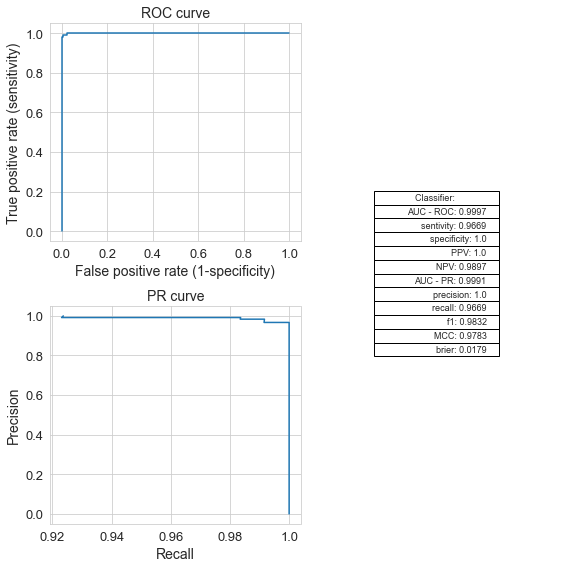

Community 2- Best model parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100} that leads to the following score: 0.8856726849155503
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
42            0.885673           0.035458      0.735474      0.09122   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
42           0.950268           0.01398                   -0.09258   

    std_test_neg_brier_score  
42                  0.008407  


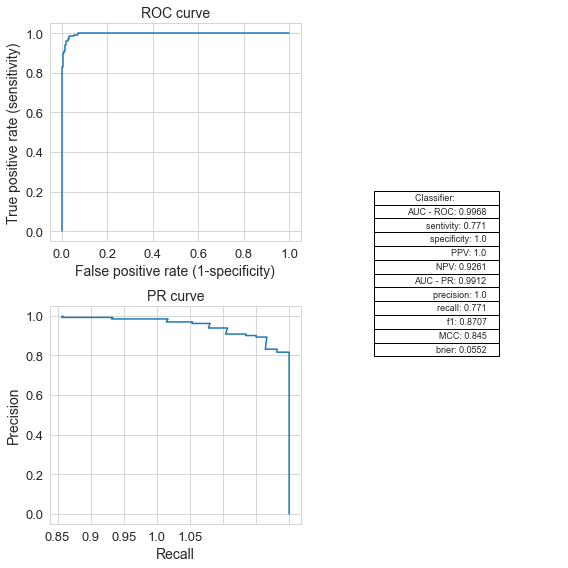

Community 3- Best model parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100} that leads to the following score: 0.9802950883323627
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
36            0.980295            0.00617      0.966195      0.01002   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
36           0.990978          0.004394                  -0.050462   

    std_test_neg_brier_score  
36                  0.001955  


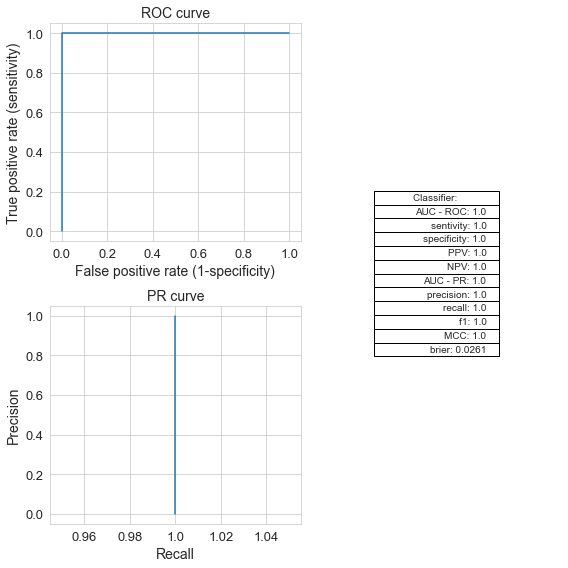

Community 4- Best model parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300} that leads to the following score: 0.788392922233316
    mean_test_balanced_accuracy  std_test_balanced_accuracy  mean_test_f1  \
41                     0.788393                    0.044908      0.693333   

    std_test_f1  mean_test_roc_auc  std_test_roc_auc  \
41     0.057496           0.961767          0.010852   

    mean_test_neg_brier_score  std_test_neg_brier_score  
41                  -0.078893                  0.004376  


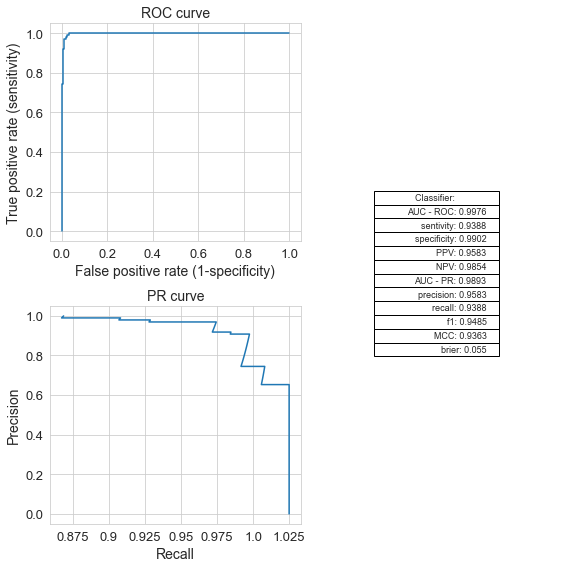

Community 5- Best model parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100} that leads to the following score: 0.5999999999999999
    mean_test_balanced_accuracy  std_test_balanced_accuracy  mean_test_f1  \
36                          0.6                     0.08165           0.3   

    std_test_f1  mean_test_roc_auc  std_test_roc_auc  \
36     0.244949           0.972803          0.036134   

    mean_test_neg_brier_score  std_test_neg_brier_score  
36                  -0.017751                  0.002981  


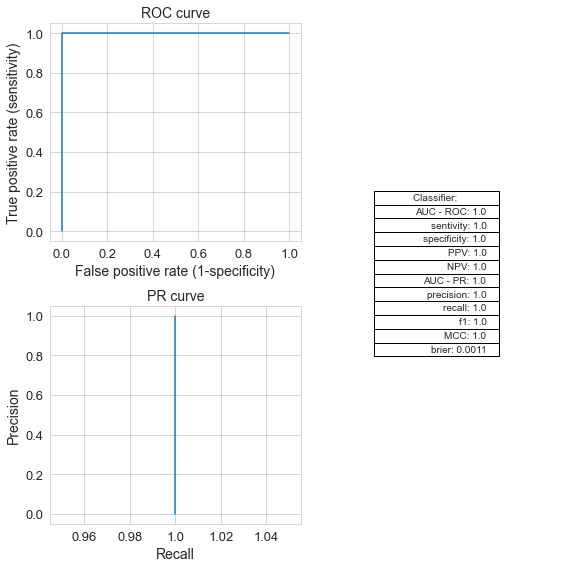

Statins_1
Anti-cholesterolemics_1
Hypercholesterolemia_1
LDL_cholesterol
Total_cholesterol
HbA1c-IFCC
HbA1c-DCCT
Age
Abdominal_circumference
Blood_sugar


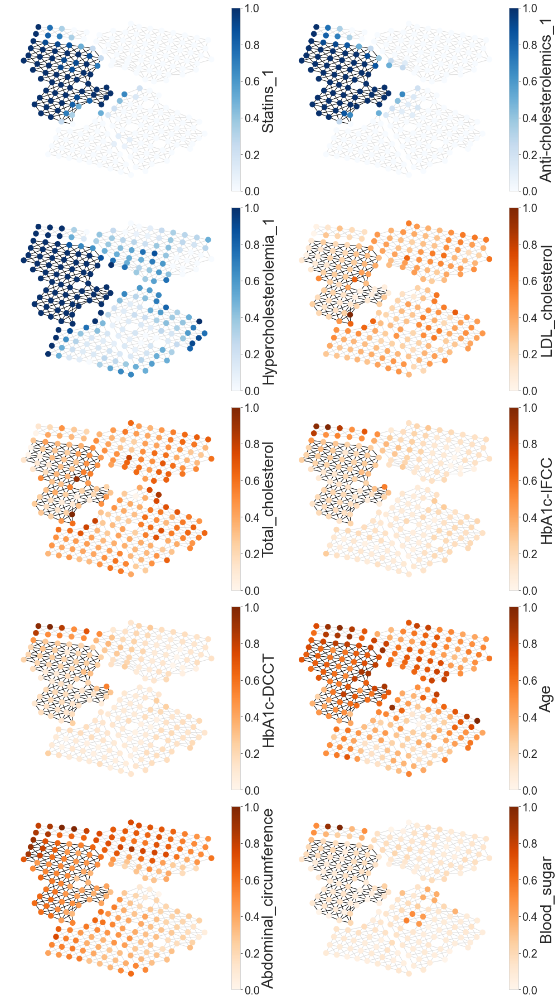

Antihypertensives_1
Hypertension_1
Weight
Statins_1
Anti-cholesterolemics_1
Uric_acid
Sex_1
Height
BMI
Abdominal_circumference


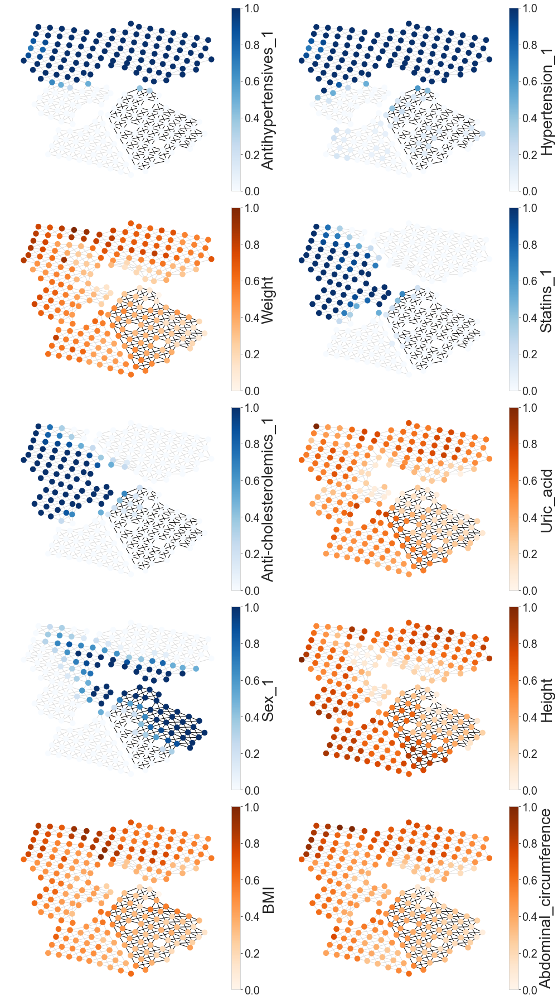

Antihypertensives_1
Hypertension_1
Statins_1
Anti-cholesterolemics_1
Sartans_1
ACE_Inhibitors_1
Hypercholesterolemia_1
Diuretics_1
Pelvis_circumference
Total_cholesterol


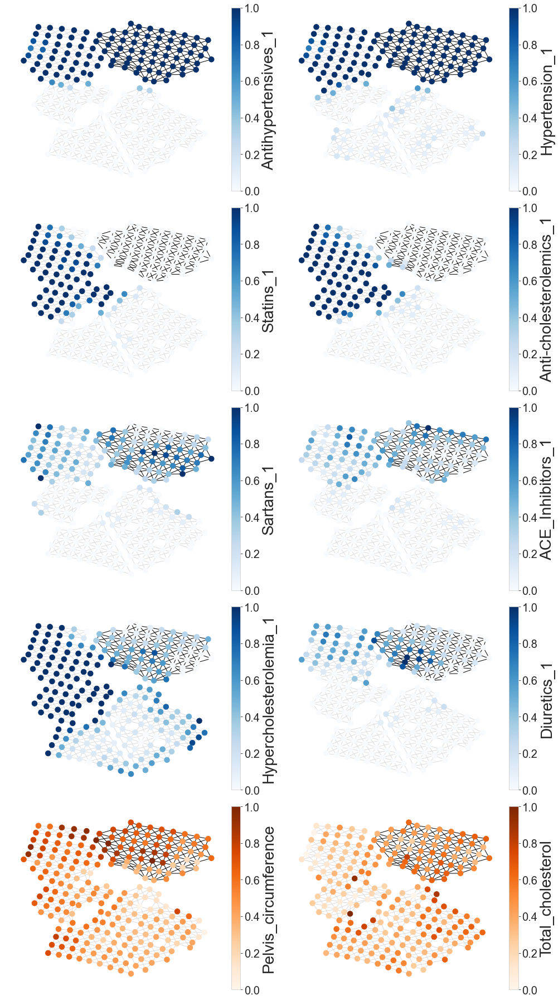

Antihypertensives_1
Hypertension_1
Menopause/andropause_1
Sex_1
Statins_1
Anti-cholesterolemics_1
Height
Sartans_1
Weight
ACE_Inhibitors_1


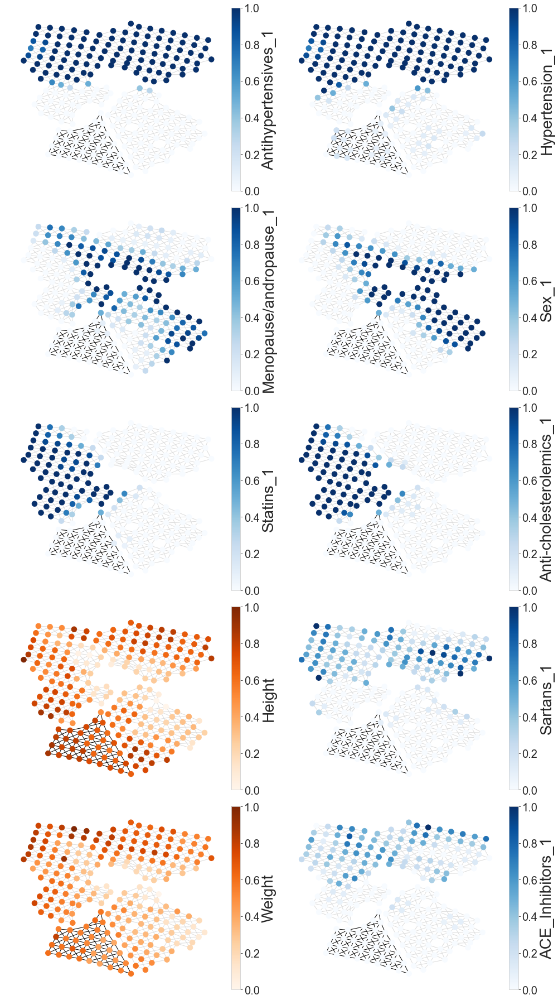

Hypoglycaemics_1
HbA1c-DCCT
Diabetes_mellitus_1
HbA1c-IFCC
Uric_acid
Blood_sugar
Systolic_blood_pressure
hsTnI
Weight
Abdominal_circumference


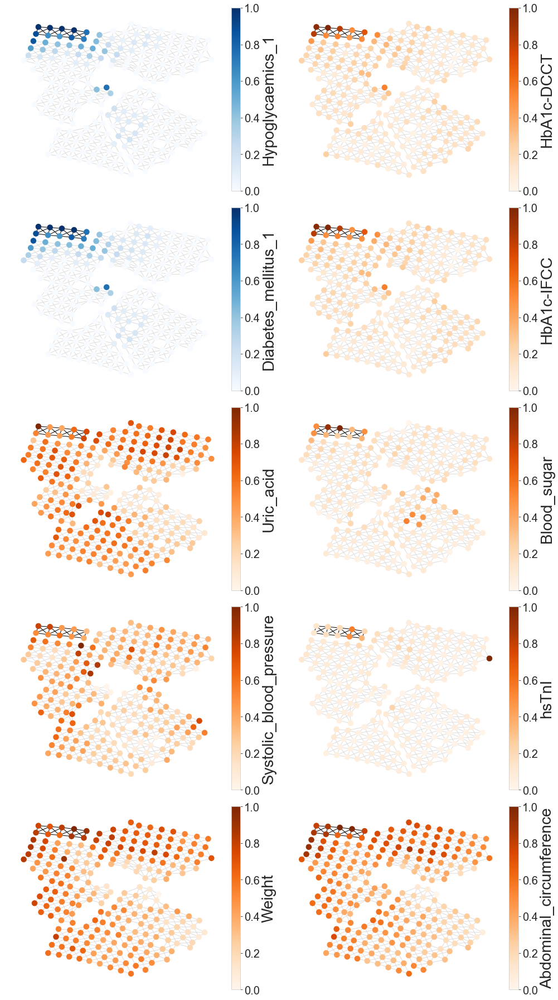

In [182]:
# Random Forest classifier
discriminative_feaures_rf, fitted_classifier_models_rf = computational_phenotyping(dataset_with_communities,['PATIENT_ID','Y_class','communities'],"random forest",203,categorical_features,
                              continue_features,id_paz1,5,scomplex,tuple_internal_color,True,True)

for gridsearchcv,value in fitted_classifier_models_rf.items():
    joblib.dump(value.best_estimator_, "results/trained_models/rf_classifier_community" + str(gridsearchcv)+ ".pkl")

Community 1- Best model parameters: {'gamma': 0.2, 'learning_rate': 0.5, 'max_depth': 3, 'n_estimators': 100} that leads to the following score: 0.9644729178800233
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
75            0.964473           0.010129       0.92716     0.021396   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
75           0.975061          0.017386                  -0.034622   

    std_test_neg_brier_score  
75                  0.011212  


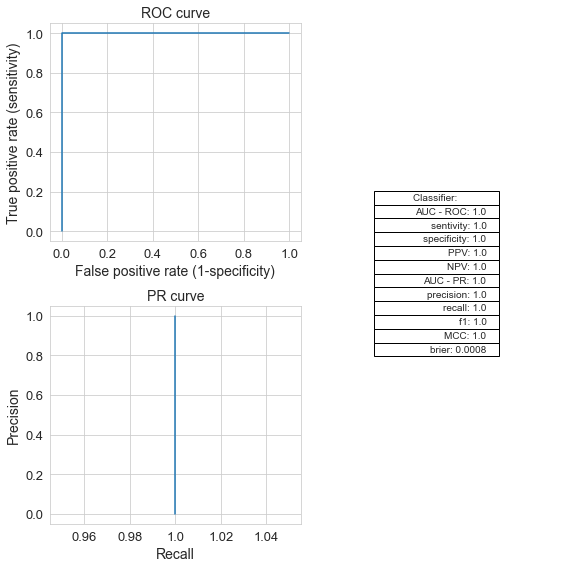

Community 2- Best model parameters: {'gamma': 0.2, 'learning_rate': 0.25, 'max_depth': 5, 'n_estimators': 100} that leads to the following score: 0.9112793632304406
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
69            0.911279           0.033599      0.817019     0.071377   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
69           0.966596          0.016575                  -0.065088   

    std_test_neg_brier_score  
69                  0.020941  


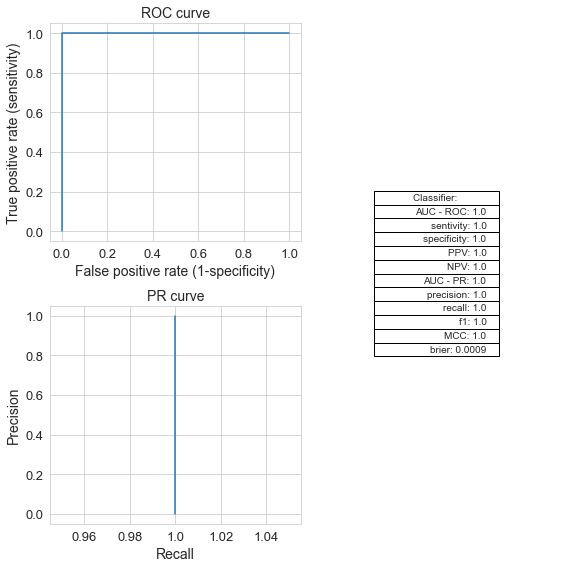

Community 3- Best model parameters: {'gamma': 0.1, 'learning_rate': 0.5, 'max_depth': 1, 'n_estimators': 100} that leads to the following score: 0.9802562609202097
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
45            0.980256           0.008878      0.965739     0.015444   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
45           0.998151          0.001055                  -0.016809   

    std_test_neg_brier_score  
45                  0.004478  


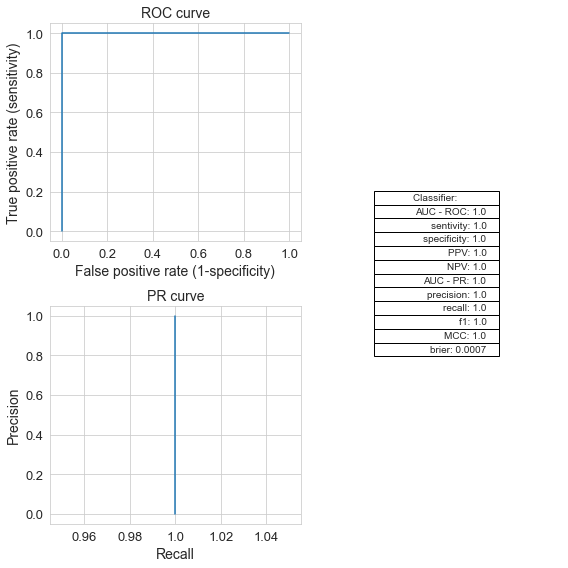

Community 4- Best model parameters: {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 300} that leads to the following score: 0.8950639471306994
   mean_test_balanced_accuracy  std_test_balanced_accuracy  mean_test_f1  \
2                     0.895064                    0.031754      0.813616   

   std_test_f1  mean_test_roc_auc  std_test_roc_auc  \
2     0.053817           0.974109          0.009022   

   mean_test_neg_brier_score  std_test_neg_brier_score  
2                  -0.053078                  0.007589  


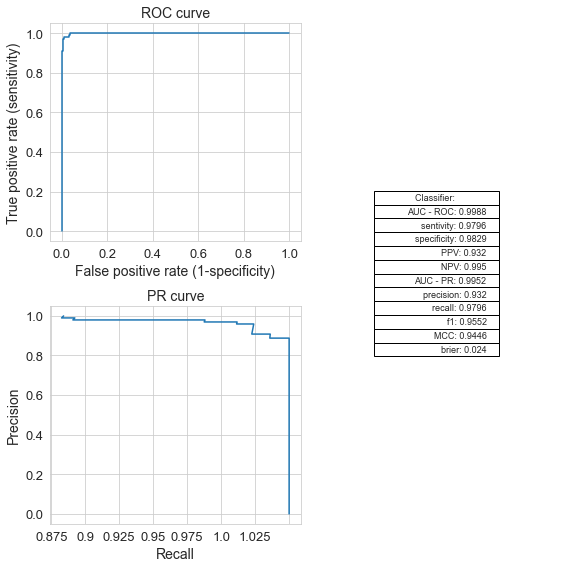

Community 5- Best model parameters: {'gamma': 0, 'learning_rate': 0.25, 'max_depth': 1, 'n_estimators': 200} that leads to the following score: 0.5656462585034013
    mean_test_balanced_accuracy  std_test_balanced_accuracy  mean_test_f1  \
10                     0.565646                    0.082504           0.2   

    std_test_f1  mean_test_roc_auc  std_test_roc_auc  \
10     0.244949           0.949825          0.035223   

    mean_test_neg_brier_score  std_test_neg_brier_score  
10                  -0.023011                  0.004621  


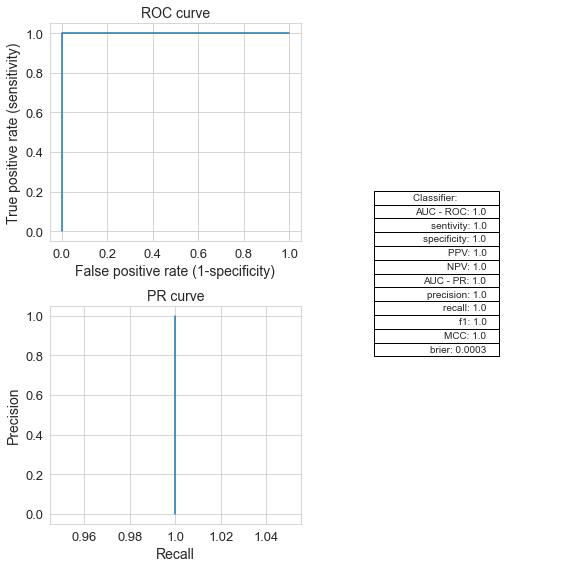

Anti-cholesterolemics_1
Statins_1
HbA1c-IFCC
n-3_PUFA_1
MCV
Blood_sugar
Abdominal_circumference
Eosinophils_#
Hypercholesterolemia_1
HDL_cholesterol


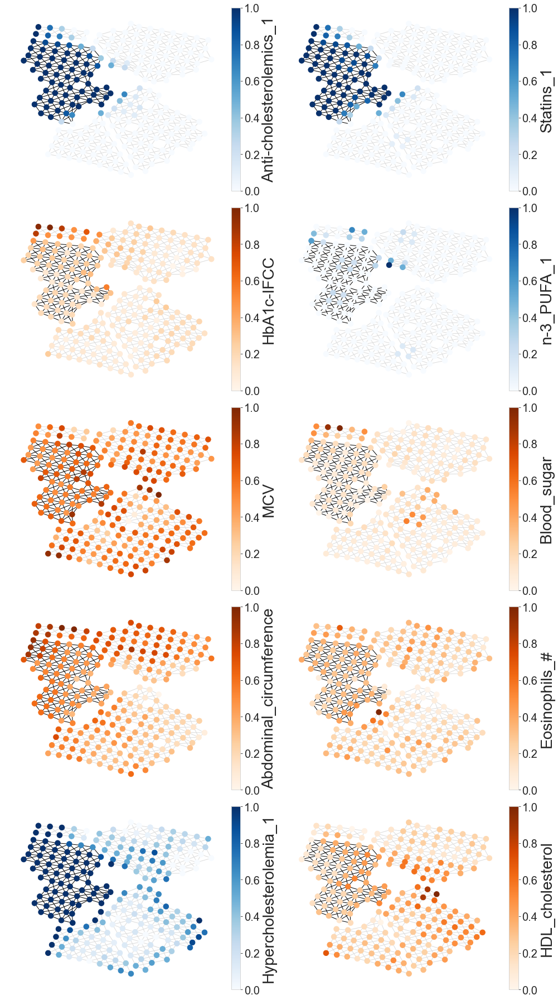

Sex_1
Antihypertensives_1
Statins_1
Anti-cholesterolemics_1
Smoking_habits_1
Weight
Family_history_of_cerebrovascular_disease_1
Basophils_#
Menopause/andropause_1
Hypercholesterolemia_1


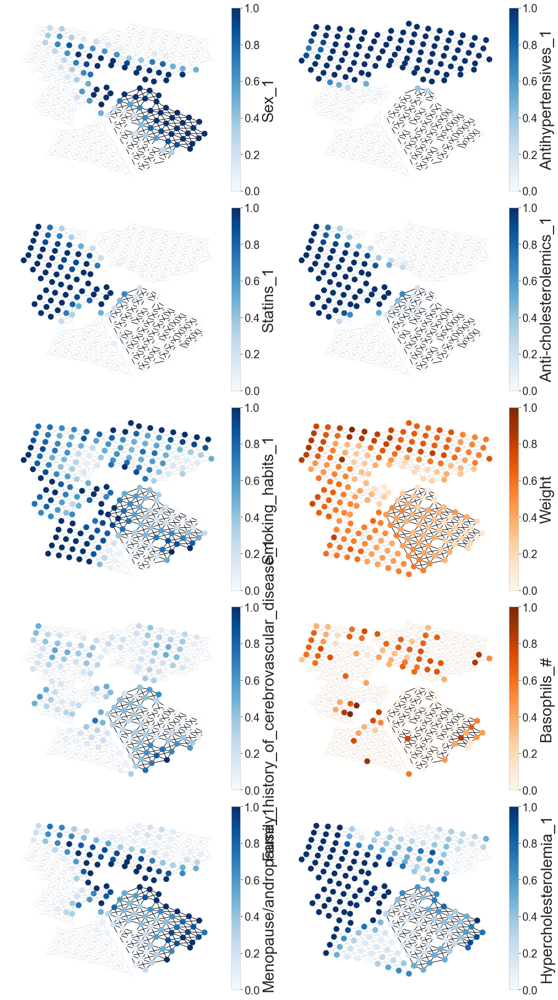

Antihypertensives_1
Statins_1
Anti-cholesterolemics_1
Hypoglycaemics_1
Blood_sugar
hsTnI
Triglycerides
Calcium_antagonists_1
MCH
Haematocrit


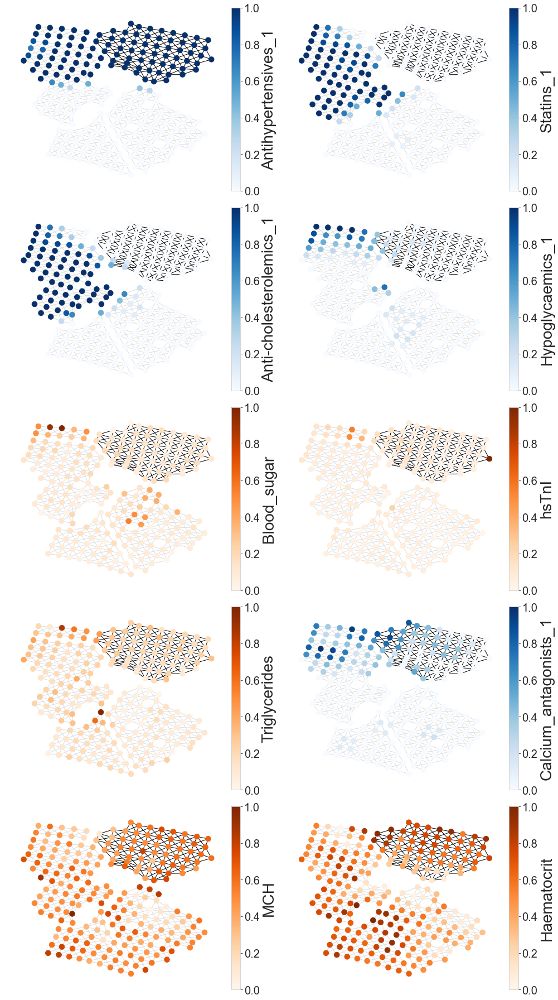

Sex_1
Antihypertensives_1
Anti-cholesterolemics_1
Menopause/andropause_1
Haematocrit
Weight
Erythrocytes
Statins_1
Blood_sugar
Family_history_of_cerebrovascular_disease_1


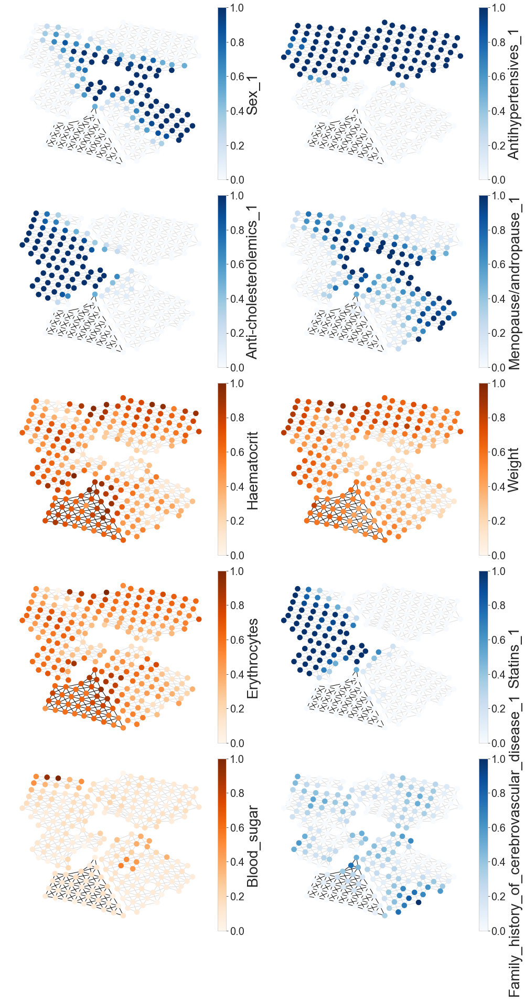

HbA1c-DCCT
Hypoglycaemics_1
Leukocytes
BMI
Triglycerides
Weight
Antihypertensives_1
LDL_cholesterol
Blood_sugar
Systolic_blood_pressure


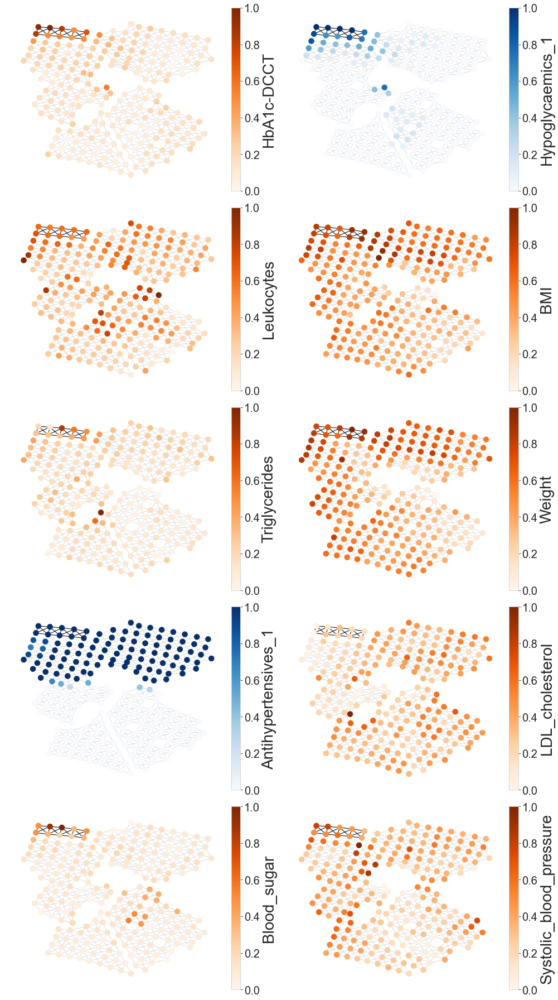

In [183]:
# XGBoost classifier
discriminative_feaures_xgb, fitted_classifier_models_xgb = computational_phenotyping(dataset_with_communities,['PATIENT_ID','Y_class','communities'],"XGBoost",203,categorical_features,
                              continue_features,id_paz1,5,scomplex,tuple_internal_color,True,True)

for gridsearchcv,value in fitted_classifier_models_xgb.items():
    joblib.dump(value.best_estimator_, "results/trained_models/xgb_classifier_community" + str(gridsearchcv)+ ".pkl")

# NO ATH / ATH predictions

In [70]:

def computational_phenotyping_baseline_groups(dataset,features_to_exclude,classifier,rnd,
                                              categorical_features, continue_features,id_paz,cv_split, yclass):
    

    variables_selected = {}
    best_model_community = {}
    
    X_train = dataset.loc[:, ~dataset.columns.isin(features_to_exclude)]
    variables_selected_community,fitted_model = training_classifier(X_train, yclass,classifier, rnd,categorical_features,continue_features,id_paz,cv_split,"ATH")
    variables_selected['CAD'] = variables_selected_community
    best_model_community['CAD']  =fitted_model     
               
    return variables_selected,best_model_community    

Community ATH- Best model parameters: {'C': 1, 'l1_ratio': 0.75} that leads to the following score: 0.6962531547272375
    mean_test_accuracy  std_test_accuracy  mean_test_f1  std_test_f1  \
11            0.696253           0.025835      0.762112      0.02285   

    mean_test_roc_auc  std_test_roc_auc  mean_test_neg_brier_score  \
11           0.753731          0.029789                  -0.194038   

    std_test_neg_brier_score  
11                  0.011631  


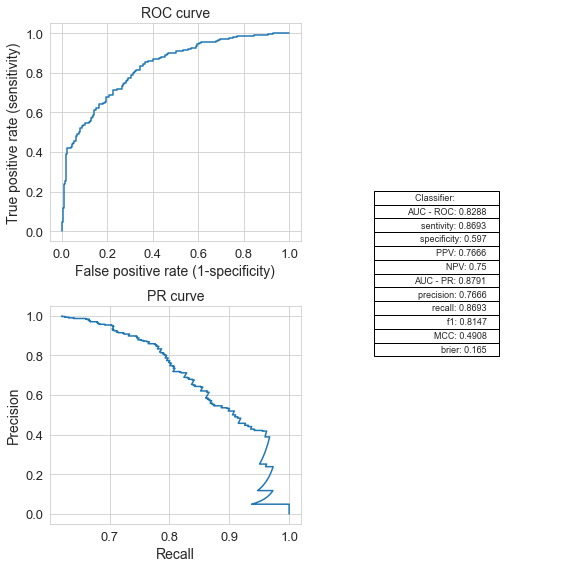

In [72]:
variables_cad, best_model_cad = computational_phenotyping_baseline_groups(trainingset_exp1,['PATIENT_ID','Y_class','CUORE_10yCV_riskscore'],"logistic regression",203,
                        categorical_features, continue_features,id_paz1,5, trainingset_exp1['Y_class'])
    

## Make the dataframe for the bubbleplot (obtained with Rstudio)

In [81]:
Subgroups = []
Feature = []
rank = []
imp_value = []
for comm, dict_features in discriminative_feaures_log.items():
    
    c = 0
    for feature, value in dict_features.items():
        if c==5:
            break
        Subgroups.append(comm)
        
        if feature == "Physical_activity_frequency_1":
            Feature.append("Physical activity frequency: Low")
        elif feature == "Physical_activity_frequency_2":
            Feature.append("Physical activity frequency: Medium")
        elif feature == "Physical_activity_frequency_3":
            Feature.append("Physical activity frequency: High")
            
        elif feature == "Sex_1":
            Feature.append("Sex: Male")
        elif feature == "Smoking_habits_1":
            Feature.append("Smokers/ex smokers")

        else:
            Feature.append(feature.replace("_"," ").replace("1",""))
        
        rank.append(5-c)
        c+=1
        imp_value.append(np.round(value,3))
        

        
data_bubble = pd.DataFrame({"Subgroups":Subgroups, "Feature":Feature, "rank":rank, "value":imp_value})

In [82]:
min_max_scaler = preprocessing.MinMaxScaler()
data_bubble_scaled = min_max_scaler.fit_transform(data_bubble['value'].to_numpy().reshape(-1, 1))
data_bubble['imp_scaled'] = np.round(data_bubble_scaled,3)
data_bubble.to_csv("results/data_bubble.csv",index=False)

## Make prediction on the test set with the best model

In [79]:

X_test = make_dummies_and_scale(testset_exp1,id_paz_test,categorical_features, continue_features, True, True)

prob_predicted = []

for community in fitted_classifier_models_log.keys():
    
    trained_model =joblib.load("exp1/results/trained_models/logit_classifier_community" + str(community) + ".pkl")
    prob = trained_model.predict_proba(X_test)
    prob_predicted.append(prob[:,1])

In [80]:
X_test_predicted_communities = pd.DataFrame({"PATIENT_ID": id_paz_test,"Prob community 1":prob_predicted[0],
              "Prob community 2":prob_predicted[1],"Prob community 3":prob_predicted[2],
              "Prob community 4":prob_predicted[3],"Prob community 5":prob_predicted[4]})

find_the_community_for_each_patient = X_test_predicted_communities[["Prob community 1","Prob community 2","Prob community 3","Prob community 4","Prob community 5"]].idxmax(axis=1)
assigned_community_vector = [int(x[-1]) for x in find_the_community_for_each_patient]

X_test['predicted_community'] = assigned_community_vector

In [81]:
X_test.to_excel("results/testset_predicted_community.xlsx",index=False)